# Мобильные приложения — Выделение групп пользователей на основе поведения

## Материалы
[Презентация](mobile_app.pdf)  
[Dashboard](https://public.tableau.com/profile/aleksandr4867#!/vizhome/Mobile_app/All)  
## Описание проекта

«Ненужные вещи» - интернет-сервис для размещения объявлений о товарах. Товары, предлагаемые к продаже, могут быть новыми и бывшими в использовании. Слоган: "Ненужные вещи» — ваши ненужные вещи нужны кому-то другому!".  

Необходимо выделить группы пользователей на основе данных об их действий при использовании приложения.  
Посмотрим как люди используют приложение, сколько времени в нём проводят, как часто совершают те или иные действия, оценим Retention rate, конверсию. 
  
А также проверить гипотезы:
1. *Некоторые пользователи установили приложение по ссылке из `yandex`, другие — из `google`. Проверить гипотезу: две эти группы демонстрируют разную конверсию в просмотры контактов.*
2. *Пользователи, которые обращаются к функции поиска по объявлениям демонстрируют лучшую конверсию в просмотры контактов.*

## План работы

1. [__Подготовка данных__](#preparation)
   - Файлы: 
     - mobile_dataset.csv
     - mobile_soures.csv
   - Заменим названия столбцов на удобные;
   - Проверим на наличие дубликатов;
   - Проверим пропуски и типы данных. Откорректируем, если нужно;  
   
2. [__Исследовательский анализ данных (EDA)__](#eda)
   - Сколько всего событий в логе?
   - Сколько всего пользователей в логе?
   - Сколько в среднем событий приходится на пользователя?
   - Данными за какой период мы располагаем?  
   - Какие события происходят чаще?
   - Построить продуктовую воронку.
   - Оценим активность пользователей (DAU, WAU, Sticky Factor).
   - Сколько длится сессия?
   - Как часто люди возвращаются? (Retention rate)
   - Частота действий?  
   
3. [__Сегментация__](#group)
   - Разделим пользователей на группы по активности;
   - Посчитаем для групп retention rate;
   - Посчитаем для групп время, проведённое в приложении (среднее для пользователя и общее для каждого пользователя); 
   - Оценим для групп частоту действий; 
   - Оценим для групп конверсию в целевое действие — просмотр контактов;
   - Какие события происходят чаще в каждой из групп?
   - Оценим активность пользователей в группах(DAU, WAU, Sticky Factor);  

4. [__Проверка гипотез__](#hypothesis)
   - *Некоторые пользователи установили приложение по ссылке из `yandex`, другие — из `google`. Проверить гипотезу: две эти группы демонстрируют разную конверсию в просмотры контактов.*
   - *Пользователи, которые обращаются к функции поиска по объявлениям демонстрируют лучшую конверсию в просмотры контактов.*    
 
5. [__Вывод__](#result)  

6. __Подготовка [дашборда](https://public.tableau.com/profile/aleksandr4867#!/vizhome/Mobile_app/All)__
   - Набор №1
     1. Построим диаграмму распределения количества событий по типу события
     2. Добавим индикатор количества пользователей
     3. Добавим фильтр дашборда по дате совершения события
   - Набор №2
     1. Построим диаграмму, отображающую количество событий по дням
     2. Построим гистограмму, отображающую количество пользователей, пришедших из разных источников
     3. Добавим фильтр дашборда по типу события
7. __Подготовка [презентации](mobile_app.pdf)__  

## Описание данных:

Датасет содержит данные о событиях, совершенных в мобильном приложении "Ненужные вещи". В нем пользователи продают свои ненужные вещи, размещая их на доске объявлений.  

В датасете содержатся данные пользователей, впервые совершивших действия в приложении после 7 октября 2019 года.  

Датасет **mobile_dataset.csv** содержит колонки:
- `event.time` — время совершения
- `event.name` — название события
- `user.id` — идентификатор пользователя  

Датасет **mobile_sources.csv** содержит колонки:
- `userId` — идентификатор пользователя
- `source` — источник, с которого пользователь установил приложение  

Расшифровки событий:
- `advert_open` — открытие карточки объявления
- `photos_show` — просмотр фотографий в объявлении
- `tips_show` — пользователь увидел рекомендованные объявления
- `tips_click` — пользователь кликнул по рекомендованному объявлению
- `contacts_show` и `show_contacts` — пользователь нажал на кнопку "посмотреть номер телефона" на карточке объявления
- `contacts_call` — пользователь позвонил по номеру телефона на карточке объявления
- `map` — пользователь открыл карту размещенных объявлений
- `search_1` — `search_7` — разные события, связанные с поиском по сайту
- `favorites_add` — добавление объявления в избранное


In [1]:
import pandas as pd
import re
colors = ["#ef476f","#ffd166","#06d6a0","#118ab2","#073b4c","#e63946","#a8dadc","#fca311","#4ecdc4"]
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
sns.set(style="whitegrid")
sns.set_palette(sns.color_palette(colors))
from plotly import graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.io as pio
pio.templates.default = "plotly_white"
pio.templates["plotly_white"] = go.layout.Template(
    layout_colorway = colors)
pio.templates.default = "plotly_white"
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import KMeans
from scipy import stats as st
import math as mth
from IPython.display import display
class color:
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

<a name="preparation"></a>
## Подготовка данных

_Посмотрим на данные, требуются ли преобразования:_

In [2]:
def camel_to_snake(name):
    new_name = re.sub('(.)([A-Z][a-z]+)', r'\1_\2', name)
    return re.sub('([a-z0-9])([A-Z])', r'\1_\2', new_name).lower()

events = pd.read_csv('../../datasets/mobile_dataset.csv')
events.columns = events.columns.str.replace('.', '_')
sources = pd.read_csv('../../datasets/mobile_sources.csv')

sources.columns = sources.columns.map(lambda x: camel_to_snake(x))
df = events.merge(sources, on='user_id', how='left')
df['event_time'] = pd.to_datetime(df['event_time'])
df['event_name'] = df['event_name'].map(lambda x: re.sub('^search_\d','search', x))
df['event_name'] = df['event_name'].replace('show_contacts', 'contacts_show')
display(df.head())
print('')
print(color.UNDERLINE + color.BOLD + 'Info:' + color.END)
print(df.info())
print('')
print(color.UNDERLINE + color.BOLD + 'Number of missing values:' + color.END)
print(df.isna().sum())
print('')
print(color.UNDERLINE + color.BOLD + 'Number of duplicates:' + color.END, df.duplicated().sum())

,event_time,event_name,user_id,source
0,2019-10-07 00:00:00.431357,advert_open,020292ab-89bc-4156-9acf-68bc2783f894,other
1,2019-10-07 00:00:01.236320,tips_show,020292ab-89bc-4156-9acf-68bc2783f894,other
2,2019-10-07 00:00:02.245341,tips_show,cf7eda61-9349-469f-ac27-e5b6f5ec475c,yandex
3,2019-10-07 00:00:07.039334,tips_show,020292ab-89bc-4156-9acf-68bc2783f894,other
4,2019-10-07 00:00:56.319813,advert_open,cf7eda61-9349-469f-ac27-e5b6f5ec475c,yandex



Info:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 74197 entries, 0 to 74196
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   event_time  74197 non-null  datetime64[ns]
 1   event_name  74197 non-null  object        
 2   user_id     74197 non-null  object        
 3   source      74197 non-null  object        
dtypes: datetime64[ns](1), object(3)
memory usage: 2.8+ MB
None

Number of missing values:
event_time    0
event_name    0
user_id       0
source        0
dtype: int64

Number of duplicates: 0


##### Комментарий:
Переименованы столбцы для удобства, столбец с датой приведён к соответствующему типу данных, таблицы объединены в одну.  
События `contacts_show` и `show_contacts`(пользователь нажал на кнопку "посмотреть номер телефона" на карточке объявления), объединены под одним именем `contacts_show`.  
События `search_1` — `search_7`(разные события, связанные с поиском по сайту), объединены под одним именем `search`.  
Дубликатов и пропусков не выявлено.  

<a name="eda"></a>
## Исследовательский анализ данных

Data available for the period from 2019-10-07 00:00 to 2019-11-03 23:58.

Total events in the log 74197.

Total users in the log 4293.

There are 17 events per user, on average, for the entire period.


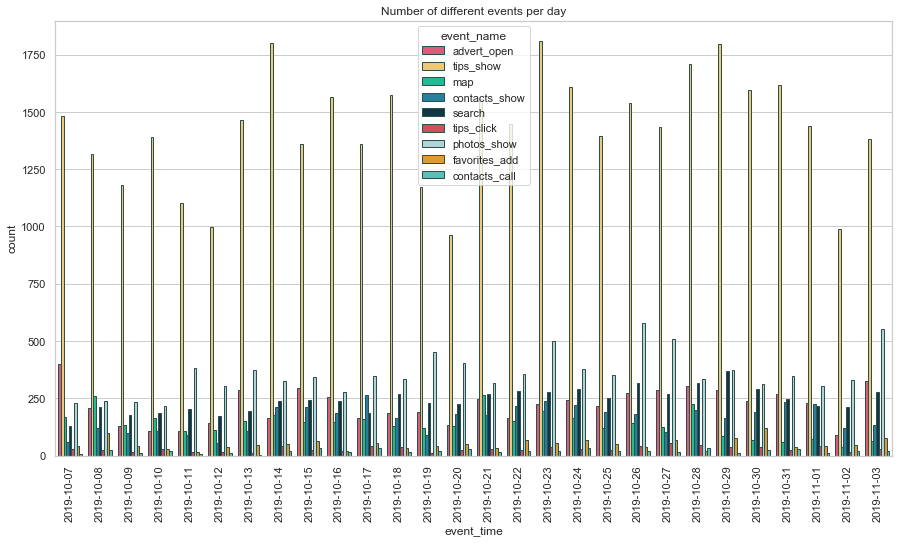

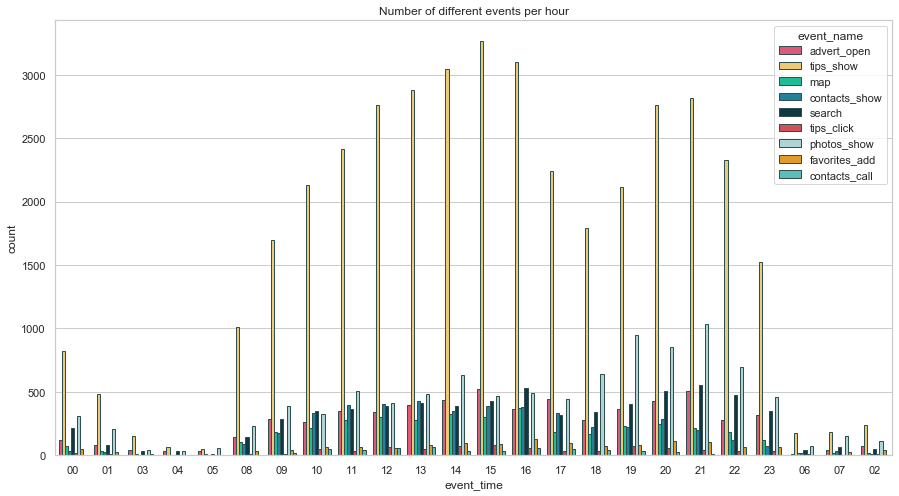

In [3]:
print('Data available for the period from {} to {}.'.format(df['event_time'].dt.strftime('%Y-%m-%d %H:%M').min(),
                                                     df['event_time'].dt.strftime('%Y-%m-%d %H:%M').max()))
print('')
print('Total events in the log {}.'.format(df['user_id'].count()))
print('')
print('Total users in the log {}.'.format(df['user_id'].nunique()))
print('')
print('There are {} events per user, on average, for the entire period.'
      .format(int(df.groupby('user_id')['event_name'].agg('count').mean())))
plt.figure(figsize=(15, 8))
ax = sns.countplot(x=df['event_time'].dt.strftime('%Y-%m-%d'), hue='event_name', data=df,
                   edgecolor='darkslategray', linewidth=1)
ax.set_title('Number of different events per day')
plt.xticks(rotation=90)
plt.show()
plt.figure(figsize=(15, 8))
ax = sns.countplot(x=df['event_time'].dt.strftime('%H'), hue='event_name', data=df,
                   edgecolor='darkslategray', linewidth=1)
ax.set_title('Number of different events per hour')
plt.show()

##### Комментарий:

Перед нами логи за 4 недели: с 2019-10-07 00:00 по 2019-11-03 23:58.  
Всего событий в логе 74197.  
Всего пользователей в логе 4293.  
В среднем на пользователя приходится 17 событий.  

Глядя на гистограмму по дате и времени, мы видим, что у нас одинаково полные данные за весь период наблюдений. Пользователи наиболее активны днём (будни с 9 до 23, в выходные с 10 до часу ночи).

_Посмотрим на распределение событий по их количеству:_

In [4]:
sources = ['yandex', 'google', 'other']

n_events = df.groupby('event_name')['user_id'].agg('count').reset_index()

fig = go.Figure(data=[go.Pie(labels=n_events.event_name,
                             values=n_events.user_id)])
fig.update_traces(hoverinfo='label+value+percent', textinfo='label+percent',
                  marker=dict(line=dict(color='darkslategray', width=1)))
fig.update_layout(title_text='Number of diffrent events, for the entire period')
fig.show()

n_events_source = df.groupby(['event_name', 'source'])['user_id'].agg('count').reset_index()

fig = make_subplots(rows=1, cols=3, specs=[[{'type':'domain'},{'type':'domain'},{'type':'domain'}]])
for i, group in enumerate(sources):
    fig.add_trace(go.Pie(labels = n_events_source.query('source == @group').event_name,
                         values=n_events_source.query('source == @group').user_id,
                         title=dict(text=group, font_size=20)), 1, i+1)
fig.update_traces(hole=.5,textinfo='label+percent',
                  hoverinfo='label+value+percent',marker=dict(line=dict(color='darkslategray', width=1)))
fig.update_layout(title_text='Number of events depending on the source')
fig.show()

##### Комментарий:
Распределение событий в логах, по популярности:  

| Событие | % для всех пользователей | % для пользователей с Яндекса | % для пользователей с Гугла | % для других источников |
| :--- | :---: | :---: | :---: | :---: |
| `tips_show` — показ рекомендованных объявлений| 54% | 58% | 49% | 52% |
| `photos_show` — показ фотографий в объявлении| 14% | 11% | 17% | 15% |
| `search_1` — `search_7` — разные события, связанные с поиском по сайту| 9% | 8% | 11% | 10% |
| `advert_open` — открытие карточки объявления| 8% | 8% | 8% | 10% |
| `contacts_show` и `show_contacts` — пользователь нажал на кнопку "посмотреть номер телефона" на карточке объявления| 6% | 6% | 7% | 5% |
| `map` — пользователь открыл карту размещенных объявлений| 5% | 6% | 5% | 5% |
| `favorites_add` — добавление объявления в избранное| 2% | 2% | 2% | 1% |
| `tips_click` — пользователь кликнул по рекомендованному объявлению| 1% | 1% | 1% | 1% |
| `contacts_call` — пользователь позвонил по номеру телефона на карточке объявления| >1% | >1% | 1% | >1% |


<a name="funnel"></a>
_Посмотрим на конверсию, с помощью простой продуктовой воронки:_

In [5]:
funnel = df.groupby('event_name')['user_id'].agg('nunique').reset_index().sort_values('user_id', ascending=False)

simple_funnel_y = list(funnel['event_name'])
simple_funnel_y.insert(0,'all_users')

fig = go.Figure()
fig.add_trace(go.Funnel(
    y = simple_funnel_y,
    x = pd.concat([pd.Series(df['user_id'].nunique()),funnel['user_id']]),
    textposition = "auto",
    textinfo = "value+percent initial",
    marker = {"color": [colors[0],colors[0],colors[0],colors[0],colors[0],
                        colors[4],colors[0],colors[0],colors[0],colors[0]],
              "line": {"width": 1, "color": 'darkslategray'}},
    connector = {"fillcolor": '#bde0eb',"line": {"width": 1, "color": 'darkslategray'}},
    insidetextfont = {'color': 'white', 'size': 14}))
fig.update_layout(title='All users simple funnel')
fig.show()

funnel_source = (df.groupby(['event_name', 'source'])['user_id']
                 .agg('nunique')
                 .reindex(pd.MultiIndex.from_product([funnel['event_name'], sources],names=['event_name', 'source']))
                 .reset_index())

fig = go.Figure()
for i, group in enumerate(sources):
    fig.add_trace(go.Funnel(
        name = group,
        y = simple_funnel_y,
        x = pd.concat([pd.Series(df.query('source == @group')['user_id'].nunique()),
                       funnel_source.query('source == @group')['user_id']]),
        textposition = "auto",
        textinfo = "percent initial",
        marker = {"color": [colors[i+1],colors[i+1],colors[i+1],colors[i+1],colors[i+1],
                            colors[i+4],colors[i+1],colors[i+1],colors[i+1],colors[i+1]],
                  "line": {"width": 1, "color": 'darkslategray'}},
        connector = {"fillcolor": '#bde0eb',"line": {"width": 1, "color": 'darkslategray'}}))
fig.update_layout(title='Source users simple funnel')
fig.show()


##### Комментарий:
Конверсия в целевое действие — просмотр контактов составляет 23%.

| Конверсия | Все пользователи | Пользователи, пришедшие с Яндекса | Пользователи, пришедшие с Google | Пользователи, пришедшие из других источников |
| :--- | :--- | :--- | :--- | :--- |
| Конверсии в просмотр рекомендованных объявлений `tips_show`| 65,2% | 67,7% | 57,7% | 68,3% |
| Конверсии в клики по рекомендованному объявлению -`tips_click` (среди всех пользователей)| 7,5% | 7,8% | 6,3% | 8,2% |
| Конверсии в клики по рекомендованному объявлению -`tips_click` (среди пользователей кому были показаны рекомендованные объявления `tips_show`)| 11,5% | 11,5% | 10,9% | 12% |
| Конверсии в просмотр карточек объявлений — `advert_open`| 17,5% | 15,4% | 17,3% | 21,1% |
| Конверсии в просмотр фотографий — `photos_show`| 25,5% | 22,9% | 32,2% | 23,5% |
| Конверсии в просмотр контактов - `contacts_show` и `show_contacts`| 22,9% | 24,7% | 24,4% | 18,5% |
| Конверсии в звонки - `contacts_call`| 5% | 4,8% | 5,9% | 4,4% |

_Посмотрим на активность пользователей:_  
- _DAU (daily active users) — количество уникальных пользователей в день;_
- _WAU (weekly active users) — количество уникальных пользователей в неделю;_  

_Также выведем соотношение пользователей, пришедших из разных источников._

In [6]:
sessions = {} # функция def_session записывает в словарь sessions начало и конец всех сессий, для каждого пользователя
def def_session(row): # функция по разделению событий на сессии (бездействие > часа = новая сессия), возвращает начало сессии
    if not sessions: 
        new_user = row['user_id']
        new_start_ts = row['event_time']
        new_previous_event_time = new_start_ts
        sessions[new_user] = {new_start_ts: new_previous_event_time}
        return new_start_ts
    
    present_user = list(sessions.keys())[-1]
    present_start_ts = list(sessions[present_user].keys())[-1]
    present_previous_event_time = sessions[present_user][present_start_ts]
    
    if row['user_id'] != present_user:
        new_user = row['user_id']
        new_start_ts = row['event_time']
        new_previous_event_time = new_start_ts
        sessions[new_user] = {new_start_ts: new_previous_event_time}
        return new_start_ts
    
    else:
        if row['event_time'] - present_previous_event_time < pd.Timedelta(hours=1):
            new_previous_event_time = row['event_time']
            sessions[present_user].update({present_start_ts: new_previous_event_time})
            return present_start_ts
        
        else:
            new_start_ts = row['event_time']
            new_previous_event_time = new_start_ts
            sessions[present_user].update({new_start_ts: new_previous_event_time})
            return new_start_ts
        
df_sessions = df.copy()
df_sessions['session_start'] = df_sessions.sort_values(['user_id', 'event_time']).apply(def_session, axis=1)
df_sessions['session_end'] = (df_sessions.sort_values(['user_id', 'event_time'])
                                .apply(lambda x: sessions[x['user_id']][x['session_start']],axis=1))


df_sessions['session_month'] = df_sessions['session_start'].dt.strftime('%Y-%m')
df_sessions['session_week']  = df_sessions['session_start'].dt.strftime('%Y-%W')
df_sessions['session_date'] = df_sessions['session_start'].dt.strftime('%Y-%m-%d')

for i in [['session_date', 'DAU'], ['session_week', 'WAU']]:
    nunique_visits_by_term = df_sessions.pivot_table(index=[i[0], 'source'], 
                                                values='user_id', 
                                                aggfunc='nunique')
    nunique_visits_by_term = nunique_visits_by_term.loc[:,['user_id']]
    nunique_visits_by_term.columns = ['number_of_active_users']
    nunique_visits_by_term = nunique_visits_by_term.reset_index()

    fig = px.bar(nunique_visits_by_term, x=i[0], y="number_of_active_users", color="source", title=i[1],
                 barmode='group')
    fig.update_traces(marker = dict(line = dict(color = 'darkslategray', width=1)))
    fig.show()
    au_yandex = int(nunique_visits_by_term.query('source == "yandex"')['number_of_active_users'].mean())
    au_google = int(nunique_visits_by_term.query('source == "google"')['number_of_active_users'].mean())
    au_other = int(nunique_visits_by_term.query('source == "other"')['number_of_active_users'].mean())
    print('{}-mean = {}'.format(i[1], (au_yandex+au_google+au_other)))
    print('Users from Yandex {}-mean = {} ({:.1%})'
          .format(i[1], au_yandex, (au_yandex/(au_yandex+au_google+au_other))))
    print('Users from Google {}-mean = {} ({:.1%})'
          .format(i[1], au_google, (au_google/(au_yandex+au_google+au_other))))
    print('Users from other sources {}-mean = {} ({:.1%})'
          .format(i[1], au_other, (au_other/(au_yandex+au_google+au_other))))


DAU-mean = 276
Users from Yandex DAU-mean = 122 (44.2%)
Users from Google DAU-mean = 73 (26.4%)
Users from other sources DAU-mean = 81 (29.3%)


WAU-mean = 1380
Users from Yandex WAU-mean = 623 (45.1%)
Users from Google WAU-mean = 358 (25.9%)
Users from other sources WAU-mean = 399 (28.9%)


##### Комментарий:
Для дальнейшего анализа активности пользователей нам понадобятся данные о времени проведенном в приложении:
- `session_start` - время начала сессии;
- `session_end` - время окончания сессии(если пользователь бездействовал больше часа сессия считается завершенной);
На представленных графиках показаны средние дневные и недельные показатели активности пользователей:  

| Активные пользователи, источник | DAU (daily active users) | WAU (weekly active users) | Sticky Factor (за неделю)|
| :--- | :---: | :---: | :---: |
| Яндекс | 122 (44,2%) | 623 (45,1%) | 19,6% |
| Goodle  | 73 (26,4%) | 358 (25,9%) | 20,4% |
| Другие | 81 (29,3%) | 399 (28,9%) | 20,3% |
| __Все__ | __276__ | __1380__ | __20%__ |

<a name="duration"></a>
_Посмотрим на длительность сессий:_

In [7]:
df_sessions['session_duration'] = (df_sessions['session_end'] - df_sessions['session_start']).dt.seconds
df_sessions['session_duration_min'] = df_sessions['session_duration'] / 60
print('Description of Session duration data:')
display(df_sessions.query('session_duration_min > 0')
        .loc[:,['session_duration_min','session_duration']].describe())
fig = go.Figure()
fig.add_trace(go.Histogram(x=df_sessions.query('session_duration_min > 0')['session_duration_min']))
fig.update_traces(marker=dict(line=dict(color='darkslategray', width=1)))
fig.update_layout(barmode='overlay', bargap=0.2, title='Session duration', yaxis_title_text='number of sessions',
    xaxis_title_text='minutes')
fig.show()
fig = px.box(df_sessions.query('session_duration_min > 0'), x='session_duration_min', color= 'source',orientation='h')
fig.update_layout(title='Session duration', xaxis=dict(title='minutes'))
fig.show()


Description of Session duration data:


,session_duration_min,session_duration
count,72322.000000,72322.000000
mean,45.067383,2704.042961
std,54.828375,3289.702473
min,0.016667,1.000000
25%,10.633333,638.000000
50%,27.000000,1620.000000
75%,58.283333,3497.000000
max,434.983333,26099.000000


##### Комментарий:
Из графиков, представленных выше, можно выделить среднею продолжительность сессии:  

|  | Яндекс | Goodle | Другие| Все |
| :--- | :---: | :---: | :---: | :---: |
| Средняя продолжительность сессии ASL (без учёта аномалий) | 28 минут | 27 минут | 21 минута | __27 минут__ |
| Средняя продолжительность сессии (с учётом аномалий)  | 50 минут | 43 минуты | 40 минут | __45 минут__ |

<a name="retention"></a>
_Посмотрим как часто люди возвращаются, для этого сделаем когортный анализ по показателю Retention Rate:_  
___
_Retention Rate показывает, сколько пользователей из когорты относительно их изначального числа вернулось в последующие периоды._

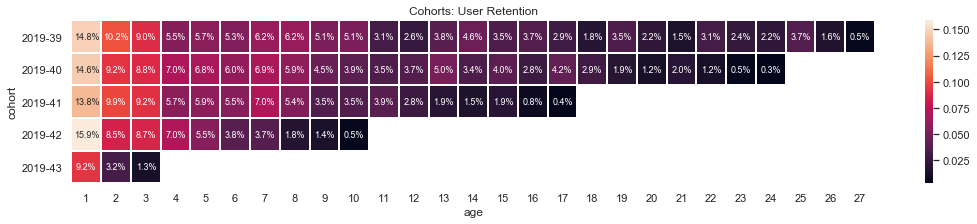

In [8]:
df_sessions['activity_date'] = df_sessions['session_start'].astype('datetime64[D]')
first_activity_date = df_sessions.groupby('user_id')['activity_date'].min()
first_activity_date.name = 'first_activity_date'

user_activity = pd.merge(df_sessions, first_activity_date, on='user_id')
user_activity['activity_week'] = user_activity['session_date'].astype('datetime64[W]')
user_activity['first_activity_week'] = user_activity['first_activity_date'].astype('datetime64[W]')

user_activity['age'] = (((user_activity['activity_date'] - user_activity['first_activity_date'])
                        / np.timedelta64(1,'D'))
                        .round()
                        .astype('int'))

cohorts = (user_activity
           .groupby(['first_activity_week', 'age'])
           .agg({'user_id': 'nunique'})
           .reset_index())
cohorts['first_activity_week'] = cohorts['first_activity_week'].dt.strftime('%Y-%W')
cohorts = cohorts.rename(columns={'first_activity_week': 'cohort'})

initial_users_count = cohorts[cohorts['age'] == 0][['cohort', 'user_id']]
initial_users_count = initial_users_count.rename(columns={'user_id': 'cohorts_users'})

cohorts = cohorts.merge(initial_users_count, on='cohort')
cohorts['retention'] = cohorts['user_id'] / cohorts['cohorts_users']

retention_pivot = cohorts[cohorts['age'] > 0].pivot_table(index='cohort',
                                     columns='age',
                                     values='retention',
                                     aggfunc='sum')

plt.figure(figsize=(18,3))
plt.title('Cohorts: User Retention')
sns.heatmap(retention_pivot,
            annot=True, fmt='.1%', linewidths=1, linecolor='white', annot_kws={"size":9})
plt.show()


##### Комментарий:
Из тепловой карты retention rate мы видим, что со временем всё меньше пользователей возвращается в приложение. Вероятно это связано с тем, что купив/продав товар, люди перестают возвращаться в приложение (возможно потом retentention rate, данные у нас в распоряжении только за месяц).

<a name="frequency"></a>
_Посмотрим на частоту действий:_

In [9]:
df_sessions['session_duration_hour'] = df_sessions['session_duration_min'] / 60
event_frequency = (df_sessions
                        .groupby('user_id')
                        .agg({'event_name': 'count'})
                        .reset_index())

total_session_length = (df_sessions.drop_duplicates(['user_id', 'session_start'])
                        .groupby('user_id')
                        .agg({'session_duration_hour': 'sum'})
                        .reset_index())

event_frequency = (event_frequency
                         .merge(total_session_length.loc[:,['user_id', 'session_duration_hour']], on='user_id'))
event_frequency['frequency'] = (event_frequency['event_name']
                                      / event_frequency['session_duration_hour'])

fig = px.histogram(event_frequency.query('session_duration_hour > 0'), x="frequency",
                   histnorm='percent',range_x=(0,5000))
fig.update_traces(marker=dict(line=dict(color='darkslategray', width=1)))
fig.update_layout(title='Events frequency', xaxis_title_text='events per hour',
                  yaxis_title_text='number of users(percentage)')
fig.show()
print('Average frequency is {:.4}'.format(event_frequency.query('session_duration_hour > 0')['frequency'].median()))

Average frequency is 37.23


##### Комментарий:
Частота действий - количество событий зафиксированных за единицу времени (в час, для графика выше):  
Средняя частота действий 37 действий в час.

<a name="group"></a>
## Сегментация

<a name="corr"></a>
_На основе исследованных ранее метрик создадим таблицу признаков активности пользователей для кластеризации:_

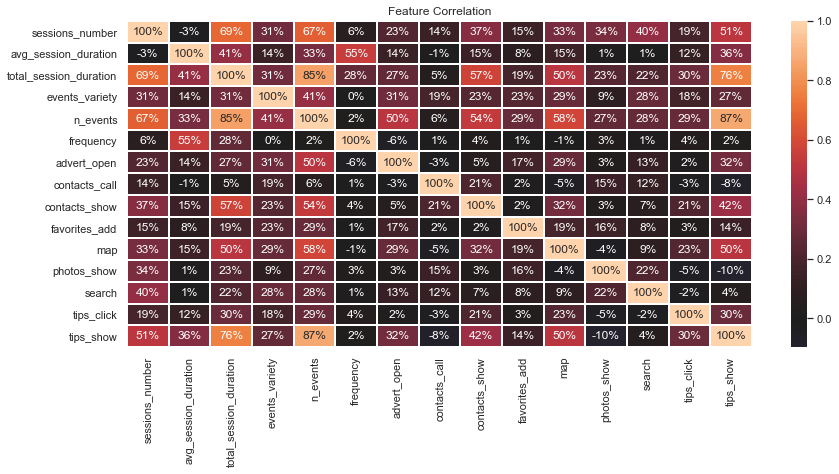

In [10]:
users = (df_sessions.drop_duplicates(['user_id', 'session_start']).groupby('user_id')
         .agg({'session_start':'count', 'session_duration': ['mean', 'sum']})
         .reset_index())
users.columns = ['user_id', 'sessions_number','avg_session_duration', 'total_session_duration']
events_variety = df_sessions.groupby('user_id').agg({'event_name':['nunique', 'count']}).reset_index()
events_variety.columns = ['user_id','events_variety', 'n_events']
users = users.merge(events_variety, on='user_id')

users['frequency'] = users['total_session_duration'] / users['n_events']

event_pivot = (df_sessions.pivot_table(index='user_id', columns='event_name', values='session_start', aggfunc='count')
               .fillna(0)
               .reset_index())
users = users.merge(event_pivot, on='user_id')
plt.figure(figsize=(14, 6))
plt.title('Feature Correlation')
sns.heatmap(users.corr(),
            annot=True, fmt='.0%', linewidths=1, linecolor='white', center=0)
plt.show()
users = users.drop(columns = 'n_events')

##### Комментарий:
Для определения активности, для каждого пользователя были выделены следующие признаки:
- `sessions_number` - количество сессий,
- `avg_session_duration` - средняя продолжительность сессии,
- `total_session_duration` - общая продолжительность сессии,
- `events_variety` - количество уникальных видов событий (выполненных хотя бы один раз),
- `frequency` - частота действий,
- `n_events` - общее количество действий,
- количество зафиксированных всех видов событий:
  - `advert_open` — открытие карточки объявления
  - `photos_show` — просмотр фотографий в объявлении
  - `tips_show` — пользователь увидел рекомендованные объявления
  - `tips_click` — пользователь кликнул по рекомендованному объявлению
  - `contacts_show` — пользователь нажал на кнопку "посмотреть номер телефона" на карточке объявления
  - `contacts_call` — пользователь позвонил по номеру телефона на карточке объявления
  - `map` — пользователь открыл карту размещенных объявлений
  - `search` — разные события, связанные с поиском по сайту
  - `favorites_add` — добавление объявления в избранное  
  
На тепловой карте корреляций признаков активности пользователей, выявлена мультиколлинеарность - явно видны смежные признаки, корреляция у которых выше 85% это `n_events`/`tips_show` и `n_events`/`total_session_duration`. Принято решение удалить признак `n_events`, т.к. при обучении модели он будет доминировать над остальными. 

_Используем агломеративную иерархическую кластеризацию и построим дендограмму, чтобы определить колтчество кластеров:_

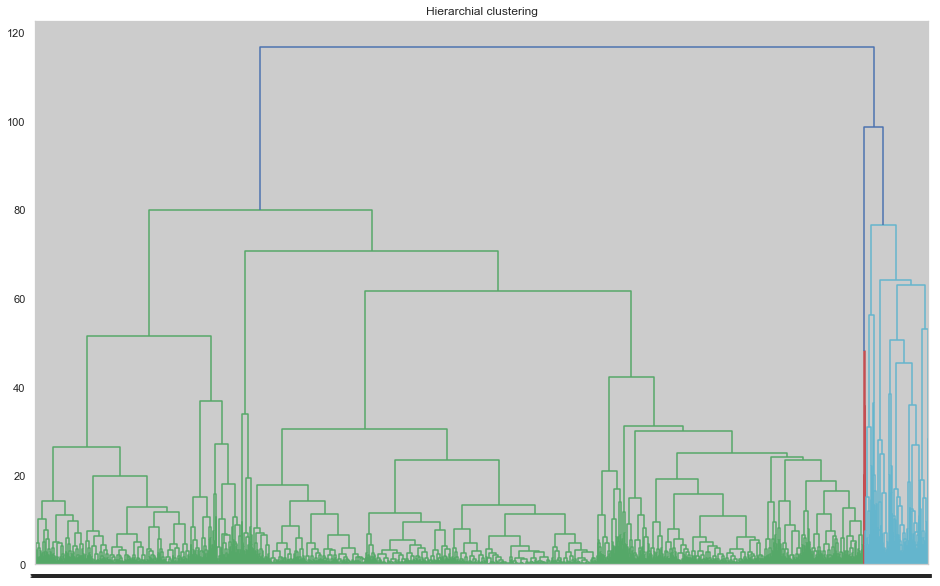

In [11]:
# стандартизируем данные
X = users.drop(columns = 'user_id')
sc = StandardScaler()
X_sc = sc.fit_transform(X)
X_sc = sc.fit_transform(X)
linked = linkage(X_sc, method = 'ward')
plt.figure(figsize=(16, 10))  
dendrogram(linked, orientation='top')
plt.title('Hierarchial clustering')
plt.xticks(rotation=0)
plt.show()

##### Коментарий:
Предложенное оптимальное число кластеров - 3.

<a name="cluster"></a>
_Обучим модель кластеризации на основании алгоритма K-Means, и спрогнозируем кластеры пользователей:_

In [12]:
km = KMeans(n_clusters = 3) # задаём число кластеров, равное 3
labels = km.fit_predict(X_sc) # применяем алгоритм к данным и формируем вектор кластеров
# сохраняем метки кластера в поле нашего датасета
users['cluster_km'] = labels

# выводим статистику по средним значениям наших признаков по кластеру
users = users.merge(df.loc[:,['user_id', 'source']], on='user_id', how='left')
users_group = users.groupby('cluster_km').agg({'user_id':'count'}).reset_index().sort_values('user_id')
users_group['group'] = ['small', 'medium', 'large']
users = users.merge(users_group.loc[:,['cluster_km','group']], on='cluster_km', how='left')
users = users.drop(columns = ['cluster_km'])
fig = px.histogram(users, x='group', color="source")
fig.update_traces(marker = dict(line = dict(color = 'darkslategray', width=1)))
fig.show()


##### Комментарий:
Путём кластеризации мы разбили пользователей на 3 группы, далее для удобства будем называть их _малая, средняя и большая_ (по количеству пользователей).

<a name="retention_group"></a>
_Посчитаем для групп retention rate:_

In [13]:
user_activity = user_activity.merge(users.loc[:,['user_id', 'group']], on='user_id')
groups_retention_rate = (user_activity
           .groupby(['group', 'age'])
           .agg({'user_id': 'nunique'})
           .reset_index())

initial_users_count = groups_retention_rate[groups_retention_rate['age'] == 0][['group', 'user_id']]
initial_users_count = initial_users_count.rename(columns={'user_id': 'group_users'})

groups_retention_rate = groups_retention_rate.merge(initial_users_count, on='group')
groups_retention_rate['retention'] = groups_retention_rate['user_id'] / groups_retention_rate['group_users']

fig = px.line(groups_retention_rate, x="age", y="retention", color='group')
fig.update_traces(marker=dict(line=dict(color='darkslategray', width=1)))
fig.update_layout(title='Groups: Retention rate', xaxis_title_text='days')
fig.show()


##### Комментарий:
- Самые высокие показатели retention rate у _малой_ группы;
- У _средней_ группы показатели в первую неделю неплохие, но к концу месяца, падают практически до ноля;
- У самой многочисленной группы retention rate практически нулевой.

<a name="duration_group"></a>
_Посчитаем для групп время, проведённое в приложении:_

In [14]:
df_sessions = df_sessions.merge(users.loc[:,['user_id', 'group']], on='user_id',how='left')
df_sessions = df_sessions.drop_duplicates()
group_session_duration_avg = (df_sessions.drop_duplicates(['user_id', 'session_start'])
                            .groupby(['group', 'user_id'])['session_duration_min']
                            .agg('mean')
                            .reset_index())
fig = px.histogram(group_session_duration_avg, x="session_duration_min",
                   color='group',histnorm='percent')
fig.update_traces(marker=dict(line=dict(color='darkslategray', width=1)))
fig.update_layout(title='Average session duration', xaxis_title_text='minutes', 
                  yaxis_title_text='number of sessions(percentage)')
fig.show()

fig = px.box(group_session_duration_avg, x='session_duration_min', color= 'group',orientation='h')
fig.update_layout(title='Average session duration', xaxis=dict(title='minutes'))
fig.show()

group_session_duration_sum = (df_sessions.drop_duplicates(['user_id', 'session_start'])
                            .groupby(['group', 'user_id'])['session_duration_hour']
                            .agg('sum')
                            .reset_index())

fig = px.histogram(group_session_duration_sum, x="session_duration_hour",
                   color='group',histnorm='percent')
fig.update_traces(marker=dict(line=dict(color='darkslategray', width=1)))
fig.update_layout(title='Total session duration', xaxis_title_text='hours',
                  yaxis_title_text='number of users(percentage)')
fig.show()

fig = px.box(group_session_duration_sum, x='session_duration_hour', color= 'group',orientation='h')
fig.update_layout(title='Total session duration', xaxis=dict(title='hours'))
fig.show()


##### Комментарий:
Время проведённое в приложении (среднее для пользователя и общее для каждого пользователя):  
- У _средней_ и _малой_ групп показатели средней продолжительности сессии похожи, а вот средние показатели по общей продолжительности сессий _средней_ группы значительно уступают _малой_;
- У самой многочисленной группы самые маленькие показатели и по средней и по общей продолжительности сессий.

<a name="frequency_group"></a>
_Оценим частоту действий в группах:_

In [15]:
group_event_frequency = (df_sessions
                           .groupby(['group', 'user_id'])
                           .agg({'event_name': 'count'})).reset_index()
group_event_frequency = (group_event_frequency
                         .merge(group_session_duration_sum.loc[:,['user_id', 'session_duration_hour']], on='user_id'))
group_event_frequency['frequency'] = (group_event_frequency['event_name']
                                      / group_event_frequency['session_duration_hour'])

fig = px.histogram(group_event_frequency.query('session_duration_hour > 0'), x="frequency", color='group',
                   histnorm='percent',range_x=(0,500), nbins=10000)
fig.update_traces(marker=dict(line=dict(color='darkslategray', width=1)))
fig.update_layout(title='Events frequency', xaxis_title_text='events per hour',
                 yaxis_title_text='number of users(percentage)')
fig.show()

fig = px.box(group_event_frequency, x='frequency', color= 'group',orientation='h',range_x=(0,500))
fig.update_layout(title='Events frequency', xaxis=dict(title='events per hour'))
fig.show()

##### Комментарий:
Частота действий - количество событий зафиксированных за единицу времени (в час, для графиков выше):  
- У _средней_ и _малой_ групп показатели частоты действий похожи;
- У самой многочисленной группы частота действий в разы выше.  

<a name="funnel_group"></a>
_Оценим для групп конверсию в целевое действие — просмотр контактов:_

In [16]:
groups = ['large', 'medium', 'small']
event_list = ['all_users', 'tips_show', 'contacts_show', 'tips_click', 'contacts_call']
funnel_group = (df_sessions.groupby(['event_name', 'group'])['user_id']
                 .agg('nunique')
                 .reindex(pd.MultiIndex.from_product([event_list[1:], groups],names=['event_name', 'group']))
                 .reset_index())

fig = go.Figure()
for i, group in enumerate(groups):
    fig.add_trace(go.Funnel(
        name = group,
        y = event_list,
        x = pd.concat([pd.Series(df_sessions.query('group == @group')['user_id'].nunique()),
                       funnel_group.query('group == @group')['user_id']]),
        textposition = "auto",
        textinfo = "percent initial",
        marker = {'color': [colors[i],colors[i],colors[i+4],colors[i],colors[i]],
                  "line": {"width": 1, "color": 'darkslategray'}},
        connector = {"fillcolor": '#bde0eb',"line": {"width": 1, "color": 'darkslategray'}}))
fig.update_layout(title='Group users simple funnel')
fig.show()

##### Комментарий:
Конверсия в целевое действие — просмотр контактов (conacts_show):
- Самые высокие показатели конверсии в просмотр контактов, у _малой_ группы, почти все пользователи открывали номер телефона, на карточке контактов;
- У _средней_ группы показатели конверсии в просмотр контактов, меньше, примерно половина пользователей смотрели номер телефона в объявлении;
- У самой многочисленной группы конверсия в просмотр контактов меньше всего.  

_Посмотрим на распределение событий в группах по их количеству:_

In [17]:
n_events_group = df_sessions.groupby(['event_name', 'group'])['user_id'].agg('count').reset_index()

fig = make_subplots(rows=1, cols=3, specs=[[{'type':'domain'},{'type':'domain'},{'type':'domain'}]])
for i, group in enumerate(groups):
    fig.add_trace(go.Pie(labels = n_events_group.query('group == @group').event_name,
                         values=n_events_group.query('group == @group').user_id,
                         title=dict(text=group, font_size=20)), 1, i+1)
fig.update_traces(hole=.5,textinfo='label+percent',
                  hoverinfo='label+value+percent',marker=dict(line=dict(color='darkslategray', width=1)))
fig.update_layout(title_text='Number of events depending on the group')
fig.show()

##### Комментарий:
В _малой_ группе топ-3 событий:
- `tips_show` — пользователь увидел рекомендованные объявления
- `contacts_show` — пользователь нажал на кнопку "посмотреть номер телефона" на карточке объявления
- `map` — пользователь открыл карту размещенных объявлений  

В _средней_ группе топ-3 событий:
- `tips_show` — пользователь увидел рекомендованные объявления
- `photos_show` — просмотр фотографий в объявлении
- `advert_open` — открытие карточки объявления  

В _большой_ группе топ-3 событий:
- `tips_show` — пользователь увидел рекомендованные объявления
- `photos_show` — просмотр фотографий в объявлении
- `search` — разные события, связанные с поиском по сайту

_Посмотрим на активность пользователей в группах:_  
- _DAU (daily active users) — количество уникальных пользователей в день;_
- _WAU (weekly active users) — количество уникальных пользователей в неделю;_  

In [18]:
small = {}
medium = {}
large = {}

for i in [['session_date', 'DAU'], ['session_week', 'WAU']]:
    nunique_visits_by_term = df_sessions.pivot_table(index=[i[0], 'group'], 
                                                values='user_id', 
                                                aggfunc='nunique')
    nunique_visits_by_term = nunique_visits_by_term.loc[:,['user_id']]
    nunique_visits_by_term.columns = ['number_of_active_users']
    nunique_visits_by_term = nunique_visits_by_term.reset_index()

    fig = px.bar(nunique_visits_by_term, x=i[0], y="number_of_active_users", color="group", title=i[1],
                 barmode='group')
    fig.update_traces(marker = dict(line = dict(color = 'darkslategray', width=1)))
    fig.show()
    au_small = int(nunique_visits_by_term.query('group == "small"')['number_of_active_users'].mean())
    small[i[1]] = au_small
    au_medium = int(nunique_visits_by_term.query('group == "medium"')['number_of_active_users'].mean())
    medium[i[1]] = au_medium
    au_large = int(nunique_visits_by_term.query('group == "large"')['number_of_active_users'].mean())
    large[i[1]] = au_large
    print('{}-mean = {}'.format(i[1], (au_small+au_medium+au_large)))
    print('Small group users {}-mean = {}'.format(i[1], au_small))
    print('Medium group users {}-mean = {}'.format(i[1], au_medium))
    print('Large group users {}-mean = {}'.format(i[1], au_large))
    print('')
print(color.UNDERLINE + color.BOLD + 'Sticky Factor:' + color.END)
print('Small group sticky factor = {:.1%}'.format(small['DAU'] / small['WAU']))
print('Medium group sticky factor = {:.1%}'.format(medium['DAU'] / medium['WAU']))
print('Large group sticky factor = {:.1%}'.format(large['DAU'] / large['WAU']))

DAU-mean = 276
Small group users DAU-mean = 7
Medium group users DAU-mean = 85
Large group users DAU-mean = 184



WAU-mean = 1380
Small group users WAU-mean = 13
Medium group users WAU-mean = 322
Large group users WAU-mean = 1045

Sticky Factor:
Small group sticky factor = 53.8%
Medium group sticky factor = 26.4%
Large group sticky factor = 17.6%


##### Комментарий:
На представленных графиках показаны средние дневные и недельные показатели активности пользователей из разных групп:  
- Самый высокий показатель sticky factor у _малой_ группы.
- У _средней_ группы показатель sticky factor ниже.
- Самый низкий показатель у _большой_ группы.

<a name="hypothesis"></a>
## Проверка гипотез

1. *Некоторые пользователи установили приложение по ссылке из `yandex`, другие — из `google`. Проверим гипотезу: две эти группы демонстрируют разную конверсию в просмотры контактов*
2. *Пользователи, которые обращаются к функции поиска по объявлениям демонстрируют лучшую конверсию в просмотры контактов.*

In [19]:
n_users = {'yandex': df[df['source']=='yandex']['user_id'].nunique(),
          'google': df[df['source']=='google']['user_id'].nunique()}
simple_funnel = {}
for group in ['yandex', 'google']:
    simple_funnel[group] =[]
    (simple_funnel[group].append(df[(df['source'] == group) & (df['event_name'] == 'contacts_show')]['user_id']
                 .nunique()))
simple_funnel = pd.DataFrame(simple_funnel)
simple_funnel['event_name'] = ['contacts_show']
zero_hypothesis = '''Пользователи, установившие приложение из Яндекса и Google демонстрируют одинаковую конверсию 
в просмотры контактов.'''

def z_value_diff(first_group, second_group, alpha, zero_hypothesis):
    for i in simple_funnel.index:
        alpha = alpha
        p1 = simple_funnel[first_group][i] / n_users[first_group]
        # пропорция успехов во второй группе:
        p2 = simple_funnel[second_group][i] / n_users[second_group]
        # пропорция успехов в комбинированном датасете:
        p_combined = ((simple_funnel[first_group][i] + simple_funnel[second_group][i]) / 
                      (n_users[first_group] + n_users[second_group]))
        # разница пропорций в датасетах
        difference = p1 - p2
        # считаем статистику в ст.отклонениях стандартного нормального распределения
        z_value = difference / mth.sqrt(p_combined * (1 - p_combined) * 
                                        (1/n_users[first_group] + 1/n_users[second_group]))
        # задаем стандартное нормальное распределение (среднее 0, ст.отклонение 1)
        distr = st.norm(0, 1) 
        p_value = (1 - distr.cdf(abs(z_value))) * 2
        print('Нулевая гипотеза:',zero_hypothesis)
        print('')
        print(color.UNDERLINE + color.BOLD + '{}:'.format(simple_funnel['event_name'][i]) + color.END,
              'p-значение: {:.2}'.format(p_value))
        if (p_value < alpha):
            print("Отвергаем нулевую гипотезу: между долями есть значимая разница.")
        else:
            print("Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными.")
    
z_value_diff('yandex','google',0.05, zero_hypothesis)
fig = go.Figure()
for i, group in enumerate(['yandex', 'google']):
    fig.add_trace(go.Funnel(
            name = group,
            y = simple_funnel_y,
            x = pd.concat([pd.Series(df.query('source == @group')['user_id'].nunique()),
                       funnel_source.query('source == @group')['user_id']]),
            textposition = "auto",
            textinfo = "value+percent initial",
            marker = {"color": [colors[i+4],colors[i+4],colors[i+4],colors[i+4],colors[i+4],colors[i+1],
                                colors[i+4],colors[i+4],colors[i+4],colors[i+4]],
                      "line": {"width": 1, "color": 'darkslategray'}},
            connector = {"fillcolor": '#bde0eb',"line": {"width": 1, "color": 'darkslategray'}}))
fig.update_layout(title_text='Source users simple funnel')
fig.show()

print('_____________________________________________________________________________________________________________')
print('')

search_ids = list(df[df['event_name']=='search']['user_id'])
def use_search(row):
    if row['user_id'] in search_ids:
        return 'use_search'
    else:
        return 'not_use_search'
df['use_search'] = df.apply(use_search, axis= 1)
search = ['use_search', 'not_use_search']

n_users = {'use_search': df[df['use_search']=='use_search']['user_id'].nunique(),
           'not_use_search': df[df['use_search']=='not_use_search']['user_id'].nunique()}
simple_funnel = {}
for group in search:
    simple_funnel[group] =[]
    (simple_funnel[group].append(df[(df['use_search'] == group) & (df['event_name'] == 'contacts_show')]['user_id']
                 .nunique()))
simple_funnel = pd.DataFrame(simple_funnel)
simple_funnel['event_name'] = ['contacts_show']
zero_hypothesis = '''Пользователи, которые обращаются к функции поиска по объявлениям и те кто не пользуются поиском,
демонстрируют одинаковую конверсию в просмотры контактов.'''
z_value_diff('use_search','not_use_search',0.05, zero_hypothesis)


funnel_search = (df.groupby(['event_name', 'use_search'])['user_id']
                 .agg('nunique')
                 .reindex(pd.MultiIndex.from_product([funnel['event_name'], search],
                                                     names=['event_name', 'use_search']))
                 .reset_index())
fig = go.Figure()
for i, el in enumerate(search):
    fig.add_trace(go.Funnel(
            name = el,
            y = simple_funnel_y,
            x = pd.concat([pd.Series(df.query('use_search == @el')['user_id'].nunique()),
                       funnel_search.query('use_search == @el')['user_id']]),
            textposition = "auto",
            textinfo = "value+percent initial",
            marker = {"color": [colors[i+7],colors[i+7],colors[i+7],colors[i+7],colors[i+7],colors[i+4],
                                colors[i+7],colors[i+7],colors[i+7],colors[i+7]],
                      "line": {"width": 1, "color": 'darkslategray'}},
            connector = {"fillcolor": '#bde0eb',"line": {"width": 1, "color": 'darkslategray'}}))
fig.update_layout(title_text='Searchers simple funnel')
fig.show()

Нулевая гипотеза: Пользователи, установившие приложение из Яндекса и Google демонстрируют одинаковую конверсию 
в просмотры контактов.

contacts_show: p-значение: 0.82
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными.


_____________________________________________________________________________________________________________

Нулевая гипотеза: Пользователи, которые обращаются к функции поиска по объявлениям и те кто не пользуются поиском,
демонстрируют одинаковую конверсию в просмотры контактов.

contacts_show: p-значение: 0.78
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными.


##### Комментарий:
Обе наши гипотезы оказались не верны:
1. Зависимости конверсии в целевое действие — просмотр контактов от того из Яндекса было скачено приложение или из Google, не выявлено.
2. Предположение, что конверсии в целевое действие — просмотр контактов мешает неудобно расположенный поиск в приложении, тоже оказалось неверным.

<a name="result"></a>
## Вывод

___"Ненужные вещи» — ваши ненужные вещи нужны кому-то другому!".___

Перед нами стояла задача выделить группы пользователей на основе анализа данных их активности при использовании приложения.  
  
А также проверить гипотезы:
1. *Некоторые пользователи установили приложение по ссылке из `yandex`, другие — из `google`. Проверить гипотезу: две эти группы демонстрируют разную конверсию в просмотры контактов.*
2. *Пользователи, которые обращаются к функции поиска по объявлениям демонстрируют лучшую конверсию в просмотры контактов.*

### Сегментация пользователей
В ходе [предобработки данных события](#preparation) `contacts_show` и `show_contacts`(пользователь нажал на кнопку "посмотреть номер телефона" на карточке объявления), объединены под одним именем `contacts_show`.  
События `search_1` — `search_7`(разные события, связанные с поиском по сайту), объединены под одним именем `search`.  
Для анализа активности пользователей было рассчитано время проведенное в приложении(если пользователь бездействовал больше часа, сессия считается завершенной, в момент последнего совершенного действия)
- `session_start` - время начала сессии;
- `session_end` - время окончания сессии;
- `session_duration` - длина сессии (в секундах).  

Анализ проводился на основе данных за 4 недели: с 2019-10-07 по 2019-11-03.  

На основе [исследованных метрик](#eda) была создана таблица признаков активности пользователей для кластеризации:
- `sessions_number` - количество сессий,
- `avg_session_duration` - средняя продолжительность сессии,
- `total_session_duration` - общая продолжительность сессии,
- `events_variety` - количество уникальных видов событий (выполненных хотя бы один раз),
- `frequency` - частота действий,
- `n_events` - общее количество действий,
- количество зафиксированных всех видов событий:
  - `advert_open` — открытие карточки объявления
  - `photos_show` — просмотр фотографий в объявлении
  - `tips_show` — пользователь увидел рекомендованные объявления
  - `tips_click` — пользователь кликнул по рекомендованному объявлению
  - `contacts_show` — пользователь нажал на кнопку "посмотреть номер телефона" на карточке объявления
  - `contacts_call` — пользователь позвонил по номеру телефона на карточке объявления
  - `map` — пользователь открыл карту размещенных объявлений
  - `search` — разные события, связанные с поиском по сайту
  - `favorites_add` — добавление объявления в избранное  
  
На [тепловой карте корреляций признаков активности пользователей](#corr), была выявлена мультиколлинеарность - смежные признаки, корреляция у которых выше 85% это `n_events`/`tips_show` и `n_events`/`total_session_duration`. Было принято решение удалить признак`n_events`, т.к. при обучении модели он бы доминировал над остальными.  

Путём [кластеризации](#cluster) мы разбили пользователей на 3 группы, в анализе они называются: _малая, средняя и большая_ (по количеству пользователей). В ходе исследования, были оценены различные [метрики в разрезе полученных групп](#retention_group):  
- ___Малая_ группа - самые активные пользователи нашего приложения. Проводят в приложении много времени, высокие показатели по retention rate, высокая конверсия и в `contacts_show` и в `contacts_call`. На данный момент это те идеальные пользователи, поведение которых, хотелось бы ретранслировать на всех остальных.__
- ___Средняя_ группа - пользователи которые потенциально могут стать частью _малой_ группы. Низкие показатели по retention rate средние показатели конверсии в `contacts_show`, длина сессий сопоставима с _малой_ группой, но общее время сессий значительно ниже.__
- ___Большая_ группа - самые проблемные пользователи. Проводят в приложении мало времени, retention rate близок к нулю и низкая конверсия.__   

__Рекомендации: Проанализировать пользователей _малой_ группы и определить aha-moment, который превратил их из обычных пользователей в активных, и ретранслировать этот опыт на пользователей _большой_ группы.__

### Ключевые метрики для групп и рекомендации

#### Retention rate
– показывает, сколько пользователей из когорты относительно их изначального числа вернулось в последующие периоды.

Из [тепловой карты когортного анализа retention rate](#retention) мы видим, что со временем всё меньше пользователей возвращается в приложение. Вероятно это связано с тем, что купив/продав товар, люди перестают возвращаться в приложение.  
Построив [график для полученных групп](#retention_group) мы выяснили, что самые высокие показатели retention rate у _малой_ группы.  Это может говорить о том, что __пользователи из _большой_ и _средней_ групп не возвращаются ни потому что купили или продали товар. А потому что не смогли разобраться в приложении или остались им не довольны.__  

__Рекомендации: Проанализировать девайсы и ОС пользователей, возможно низкий retention rate связан с некорректной работой интерфейса или с ошибками на определённых устройствах.__

#### Время, проведённое в приложении
– среднее для пользователя и общее для каждого пользователя.

В исследовании можно увидеть как [среднею продолжительность сессии](#duration) по всему датасету, так и данные по времени проведённому в приложении пользователями [разных групп](#duration_group):
- У _средней_ и _малой_ групп показатели средней продолжительности сессии похожи, а вот средние показатели по общей продолжительности сессий _средней_ группы значительно уступают _малой;_
- У самой многочисленной группы самые маленькие показатели и по средней и по общей продолжительности сессий.  
Это говорит, что __в _средней_ группе есть пользователи, которые проводят время достаточное для конверсии в просмотр контактов и звонков, но пользуются они сервисом редко. В _большой_ группе пользователи проводят в приложении недостаточно времени для хороших показателей конверсии.__

__Рекомендации:__
- __Для _средней_ группы - провести исследование, возможно в рамках a/b теста, рассылки push-уведомлений с напоминанием об использовании приложения/ возможно скидкой на доставку, если такая возможность есть.__  
- __Для _большой_ группы - исследовать UX, узнать, почему пользователи так быстро уходят.__
- __Проанализировать девайсы и ОС пользователей, с аномально короткими сессиями, возможно короткие сессии связаны с некорректной работой интерфейса или с ошибками на определённых устройствах.__  

#### Частота действий
– количество событий зафиксированных за единицу времени:  

В ходе анализа как [частоты действий всего датасета](#frequency), так и данных в разрезе [полученных групп](#frequency_group), были __обнаружены аномально активные пользователи(несколько действий за очень короткие сессии) в _большой_ группе.__  

__Рекомендации: провести исследование аномальной частоты событий, возможно большое количество событий влияет на отток пользователей.__

#### Конверсия в просмотр контактов (conacts_show)

В ходе исследования была построена продуктовая воронка и изучена конверсия в целевое действие — просмотр контактов, [для всего датасета в разрезе источников](#funnel) и для [полученных групп](#funnel_group):
- __Самые высокие показатели конверсии в просмотр контактов, у _малой_ группы, почти все пользователи открывали номер телефона, на карточке контактов;__
- __У _средней_ группы показатели конверсии в просмотр контактов, меньше, примерно половина пользователей смотрели номер телефона в объявлении;__
- __У самой многочисленной группы конверсия в просмотр контактов меньше всего.__  

__Рекомендации: провести анализ поведения пользователей с низкой и высокой конверсией, в контексте используемых устройств при работе с приложением. Возможно не на всех устройствах/ОС кнопка отобразить контакты отображается корректно.__  


## Проверка гипотез

#### Гипотеза о разной конверсии в зависимости от источника(Яндекс и Google)

*Некоторые пользователи установили приложение по ссылке из `yandex`, другие — из `google`. Проверить гипотезу: две эти группы демонстрируют разную конверсию в просмотры контактов.*

Для проверки нулевой гипотезы о равенстве долей _(пользователи, установившие приложение из `yandex` и `google` демонстрируют одинаковую конверсию в просмотры контактов)_ мы провели [статистическую проверку](#hypothesis) с уровнем значимости 0.05. Проверка не выявила значимой разницы. Это говорит о том, что __от источника (`yandex` или `google`) конверсия в целевое действие — просмотр контактов не зависит, и нет значимой разницы, где заниматься продвижением приложения.  

#### Гипотеза об использовании поиска, как пути к увеличению конверсии

*Пользователи, которые обращаются к функции поиска по объявлениям демонстрируют лучшую конверсию в просмотры контактов.*

Для проверки нулевой гипотезы о равенстве долей _(пользователи, которые обращаются к функции поиска по объявлениям и те кто не пользуются поиском, демонстрируют одинаковую конверсию в просмотры контактов)_ мы провели [статистическую проверку](#hypothesis) с уровнем значимости 0.05. Проверка тоже не выявила значимой разницы. __Предположение, что конверсии в целевое действие — просмотр контактов мешает неудобно расположенный поиск в приложении, тоже оказалось неверным.__ 